# FLujo de trabajo de un cubo sísmico PSDM

## Leer cubo 3D y revisar que todo esté bien

In [1]:
import numpy as np
import segyio
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText

In [2]:
matplotlib.rcParams['figure.figsize'] = (12.0, 8.75)

In [7]:
segy_file = 'datos_sismicos/ST0202.segy'

In [8]:
f = segyio.open(segy_file, ignore_geometry=True)

In [9]:
segyio.tools.wrap(f.text[0])

'C01 CLIENT : STATOIL                              PROCESSED BY: WESTERNGECO\nC02 AREA   : VOLVE, BLOCK 15/9,  NORTH SEA - ST0202      SURVEY: 3D 4C 0BC\nC03 4D POST-STACK FINAL PSDM                     DATE: 2012-03-30\nC04 DATA FORMAT: SEGY       DATA TYPE: STACK-FULL ANGLE, 3-41 DEGREES (D)\nC05 ---------------------AQUISITION PARAMETRS----------------------------------\nC06 DATA SHOT BY VESSEL: M/V GECO ANGLER & WESTERN INLET  CABLE LENGTH:6100 M\nC07 NO OF GROUPS: 960/P,X,Y,Z.  NO OF CABLES: 2  ARRAY VOL/SOURCE: 2250 CU IN.\nC08 GROUP INTERVAL: 25M     SHOT INTERVAL: 25M (FLIP-FLOP)\nC09 GEODECTIC DATUM:  ED50      SPHEROID: INTERNAT 1924.     PROJECTION: UTM\nC10 UTM ZONE: 31 N\nC11 RECORD LENGTH: 10000 MS     SAMPLE INTERVAL: 2 MS\nC12 NAVIGATION SOURCE P1/90 UKOOA, SPS\nC13 ----------------------PROCESSING SEQUENCE----------------------------------\nC14 REFORMAT, RESAMPLING TO 4MS, NAV/SEISMIC DATA MERGE\nC15 Z TO P AMP. MATCH & DESIGNATURE,TIDAL STATIC CORRECTION, NOISE ATTENU

In [10]:
print(segyio.tools.wrap(f.text[0]))

C01 CLIENT : STATOIL                              PROCESSED BY: WESTERNGECO
C02 AREA   : VOLVE, BLOCK 15/9,  NORTH SEA - ST0202      SURVEY: 3D 4C 0BC
C03 4D POST-STACK FINAL PSDM                     DATE: 2012-03-30
C04 DATA FORMAT: SEGY       DATA TYPE: STACK-FULL ANGLE, 3-41 DEGREES (D)
C05 ---------------------AQUISITION PARAMETRS----------------------------------
C06 DATA SHOT BY VESSEL: M/V GECO ANGLER & WESTERN INLET  CABLE LENGTH:6100 M
C07 NO OF GROUPS: 960/P,X,Y,Z.  NO OF CABLES: 2  ARRAY VOL/SOURCE: 2250 CU IN.
C08 GROUP INTERVAL: 25M     SHOT INTERVAL: 25M (FLIP-FLOP)
C09 GEODECTIC DATUM:  ED50      SPHEROID: INTERNAT 1924.     PROJECTION: UTM
C10 UTM ZONE: 31 N
C11 RECORD LENGTH: 10000 MS     SAMPLE INTERVAL: 2 MS
C12 NAVIGATION SOURCE P1/90 UKOOA, SPS
C13 ----------------------PROCESSING SEQUENCE----------------------------------
C14 REFORMAT, RESAMPLING TO 4MS, NAV/SEISMIC DATA MERGE
C15 Z TO P AMP. MATCH & DESIGNATURE,TIDAL STATIC CORRECTION, NOISE ATTENUATION
C16 PZ CA

In [6]:
f.samples[:5]

array([12., 16., 20., 24., 28.])

In [11]:
with segyio.open (segy_file) as segyf:
    n_traces = segyf.tracecount
    sample_rate = segyf.sample_rate
    n_samples = segyf.samples.size
    n_il = len(segyf.ilines)

ValueError: Inlines inconsistent, expect all inlines to be unique

In [12]:
f = segyio.open(segy_file, ignore_geometry=True)
ntraces = len(f.trace)
inlines = []
xlines = []

for i in range(ntraces):
    headeri = f.header[i]
    inlines.append(headeri[segyio.su.iline])
    xlines.append(headeri[segyio.su.xline])

print('Numero de trazas: ', ntraces)
print(f'Primeros 10 inlines: {inlines[:10]}')
print(f'Primeros 10 xlines: {xlines[:10]}')

Numero de trazas:  256614
Primeros 10 inlines: [9961, 9961, 9961, 9961, 9961, 9961, 9961, 9961, 9961, 9961]
Primeros 10 xlines: [1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972]


In [13]:
inlines = []
xlines = []

for h in f.header:
    inlines.append(h[segyio.su.iline])
    xlines.append(h[segyio.su.xline])

print('Numero de trazas: ', ntraces)
print(f'Primeros 10 inlines: {inlines[:10]}')
print(f'Primeros 10 xlines: {xlines[:10]}')

Numero de trazas:  256614
Primeros 10 inlines: [9961, 9961, 9961, 9961, 9961, 9961, 9961, 9961, 9961, 9961]
Primeros 10 xlines: [1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972]


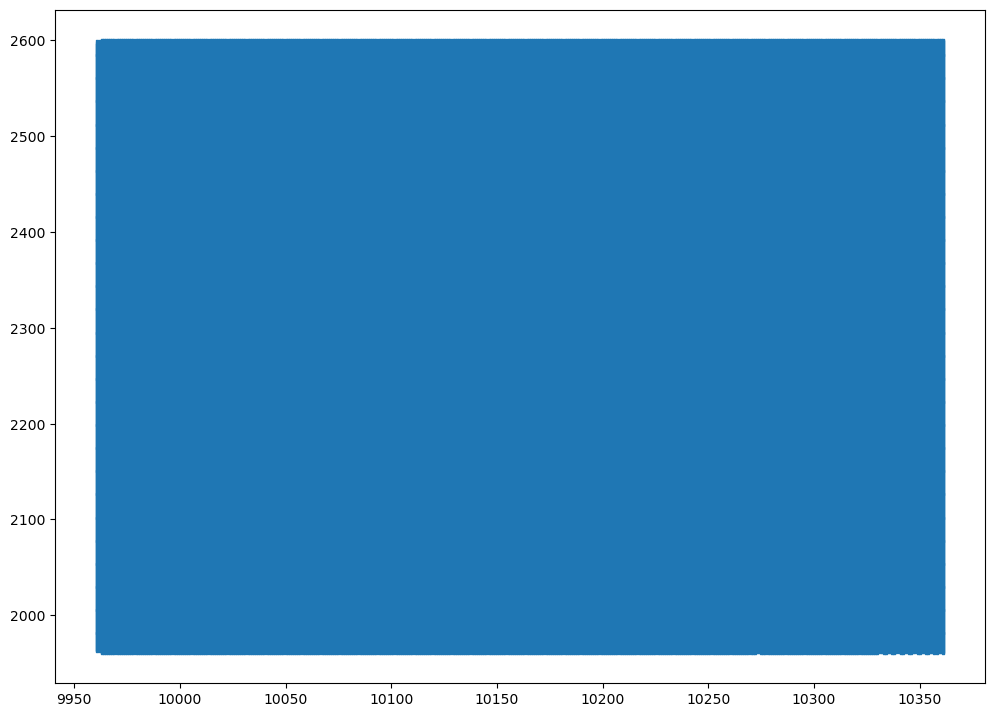

In [14]:
plt.scatter(inlines, xlines, marker ="s", s=1)

In [15]:
import itertools
unique_inlines = set(inlines)
unique_xlines = set(xlines)
real = set(zip(inlines, xlines))
grid = set(itertools.product(unique_inlines, unique_xlines))
missing = grid - real

In [16]:
missing

{(9961, 1961),
 (9961, 1962),
 (9961, 2598),
 (9961, 2600),
 (9962, 1961),
 (9962, 1962),
 (9962, 2598),
 (9962, 2600),
 (10273, 1961),
 (10274, 1961),
 (10331, 1961),
 (10332, 1961),
 (10335, 1961),
 (10336, 1961),
 (10339, 1961),
 (10340, 1961),
 (10343, 1961),
 (10344, 1961),
 (10347, 1961),
 (10348, 1961),
 (10351, 1961),
 (10352, 1961),
 (10355, 1961),
 (10356, 1961),
 (10359, 1961),
 (10360, 1961)}

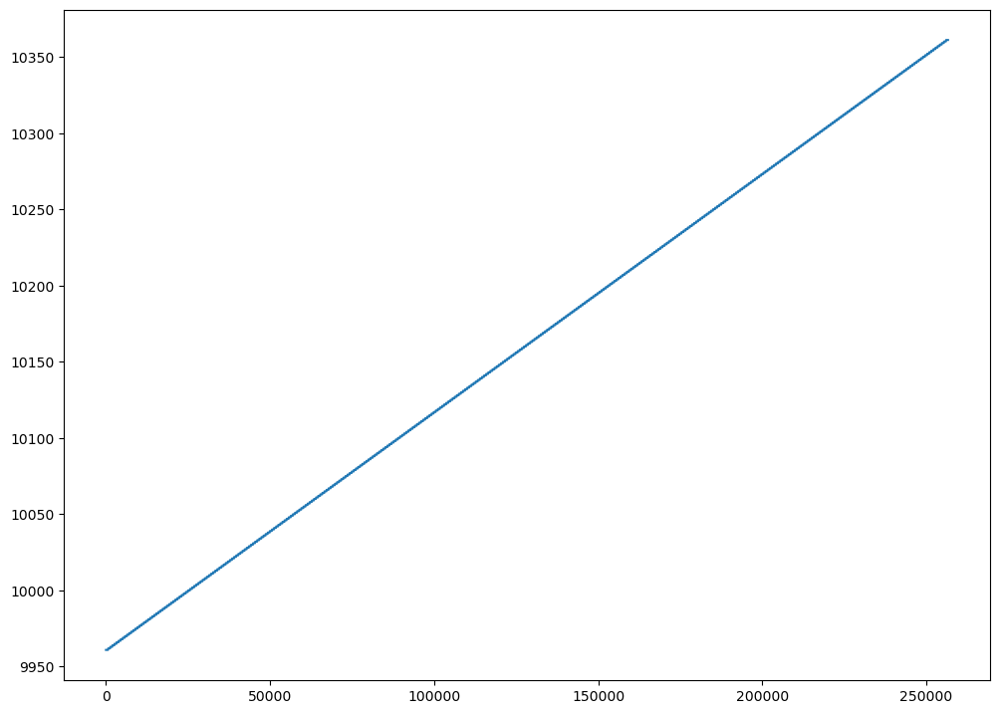

In [23]:
plt.plot(inlines)

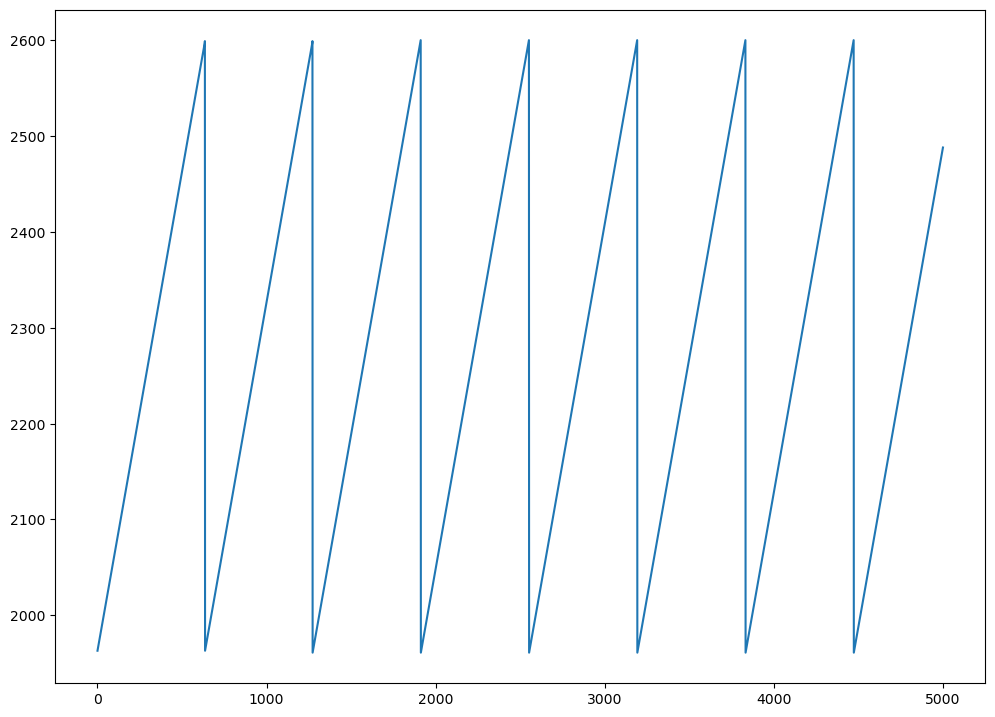

In [19]:
plt.plot(xlines[:5000])

In [20]:
ils = np.unique(inlines)
xls = np.unique(xlines)
inline_interval = ils[1:] - ils[:-1]
xline_interval = xls[1:] - xls[:-1]

In [21]:
print(f'Intervalo de inlines: {inline_interval}')
print(f'Intervalo de xlines: {xline_interval}')

Intervalo de inlines: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Intervalo de xlines: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

In [24]:
ils = sorted(unique_inlines)
xls = sorted(unique_xlines)

lineindex = {
    (il, xl): i
    for i, (il, xl) in enumerate(sorted(grid))
}

In [25]:
lineindex

{(9961, 1961): 0,
 (9961, 1962): 1,
 (9961, 1963): 2,
 (9961, 1964): 3,
 (9961, 1965): 4,
 (9961, 1966): 5,
 (9961, 1967): 6,
 (9961, 1968): 7,
 (9961, 1969): 8,
 (9961, 1970): 9,
 (9961, 1971): 10,
 (9961, 1972): 11,
 (9961, 1973): 12,
 (9961, 1974): 13,
 (9961, 1975): 14,
 (9961, 1976): 15,
 (9961, 1977): 16,
 (9961, 1978): 17,
 (9961, 1979): 18,
 (9961, 1980): 19,
 (9961, 1981): 20,
 (9961, 1982): 21,
 (9961, 1983): 22,
 (9961, 1984): 23,
 (9961, 1985): 24,
 (9961, 1986): 25,
 (9961, 1987): 26,
 (9961, 1988): 27,
 (9961, 1989): 28,
 (9961, 1990): 29,
 (9961, 1991): 30,
 (9961, 1992): 31,
 (9961, 1993): 32,
 (9961, 1994): 33,
 (9961, 1995): 34,
 (9961, 1996): 35,
 (9961, 1997): 36,
 (9961, 1998): 37,
 (9961, 1999): 38,
 (9961, 2000): 39,
 (9961, 2001): 40,
 (9961, 2002): 41,
 (9961, 2003): 42,
 (9961, 2004): 43,
 (9961, 2005): 44,
 (9961, 2006): 45,
 (9961, 2007): 46,
 (9961, 2008): 47,
 (9961, 2009): 48,
 (9961, 2010): 49,
 (9961, 2011): 50,
 (9961, 2012): 51,
 (9961, 2013): 52,
 (9

In [26]:
d = np.zeros((len(ils), len(xls), len(f.samples)))
lineard = d.reshape(d.shape[0] * d.shape[1], d.shape[2])

for il, xl, trace in zip(inlines, xlines, f.trace[:]):
    lineard[lineindex[il, xl]][:] = trace[:]

In [27]:
d.shape

(401, 640, 1125)

## Plotear los datos arreglados

In [28]:
ilines = np.array(sorted(unique_inlines))
xlines = np.array(sorted(unique_xlines))
t = np.array(f.samples) # Profundidad, se definió como "t" al pensar que era tiempo (twt)

In [31]:
vm = np.percentile(d, 95)
print(vm)

2.110898971557617


In [32]:
central_inline = len(ilines) // 2

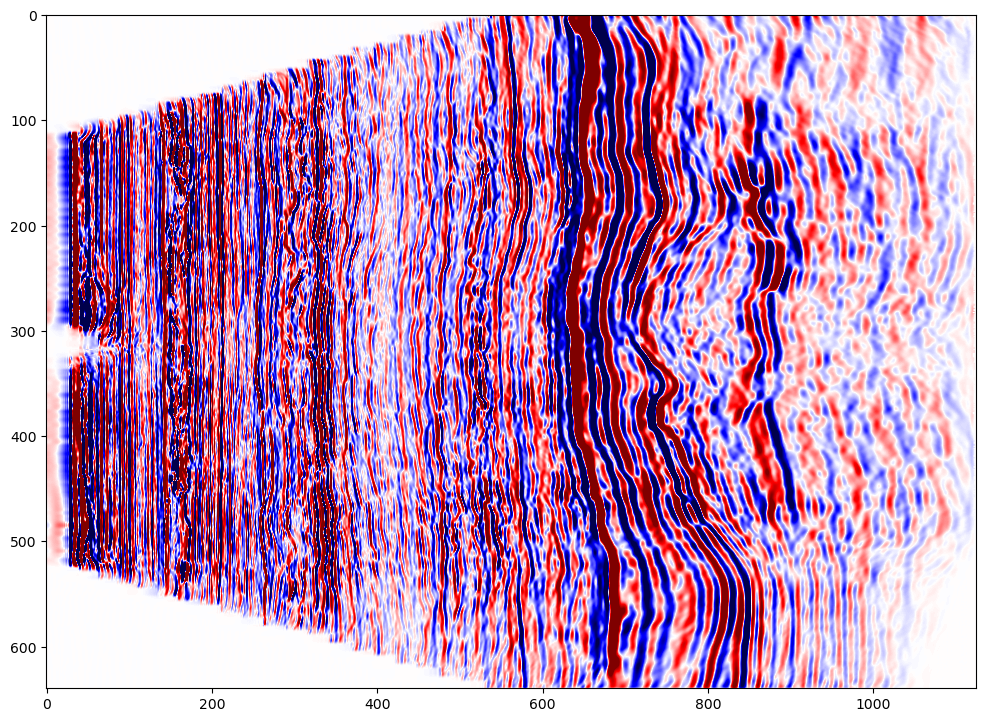

In [33]:
plt.imshow(d[central_inline, :, :], cmap='seismic', vmin=-vm, vmax=vm, aspect='auto')

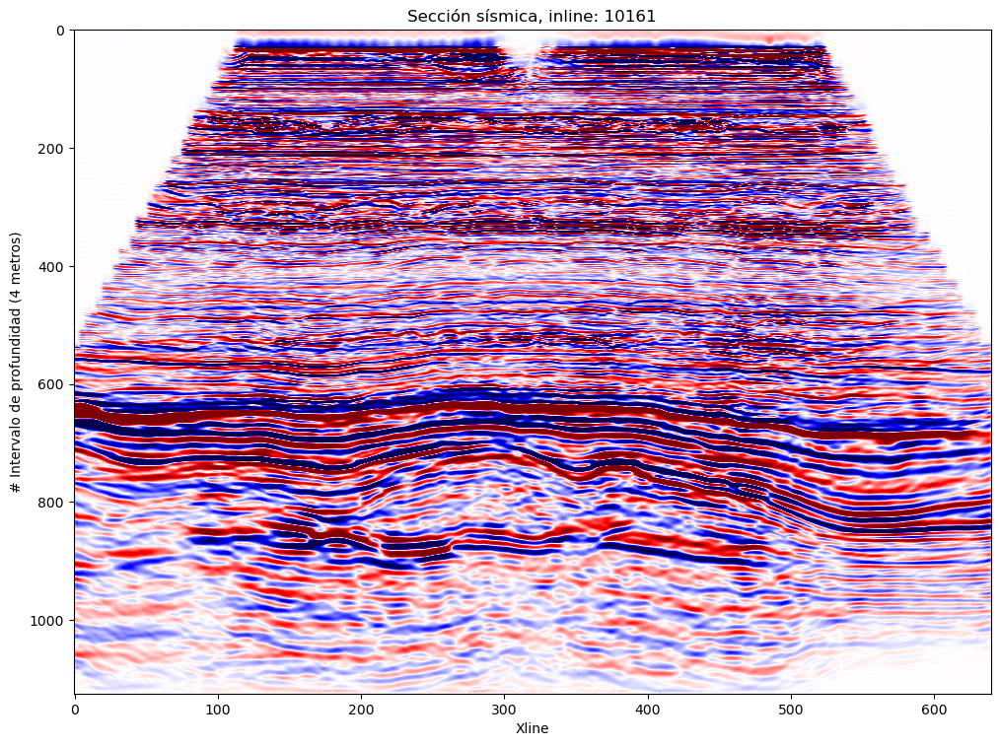

In [44]:
extent = [xlines[0], xlines[-1], t[-1], t[0]]

plt.imshow(d[central_inline, :, :].T, cmap='seismic', vmin=-vm, vmax=vm, aspect='auto')
plt.xlabel('Xline')
plt.ylabel('# Intervalo de profundidad (4 metros)')
plt.title('Sección sísmica, inline: ' + str(ilines[central_inline]))
plt.show()

In [38]:
depth_mid = len(t) // 2

extent = [xlines[0], xlines[-1], ilines[0], ilines[-1]]

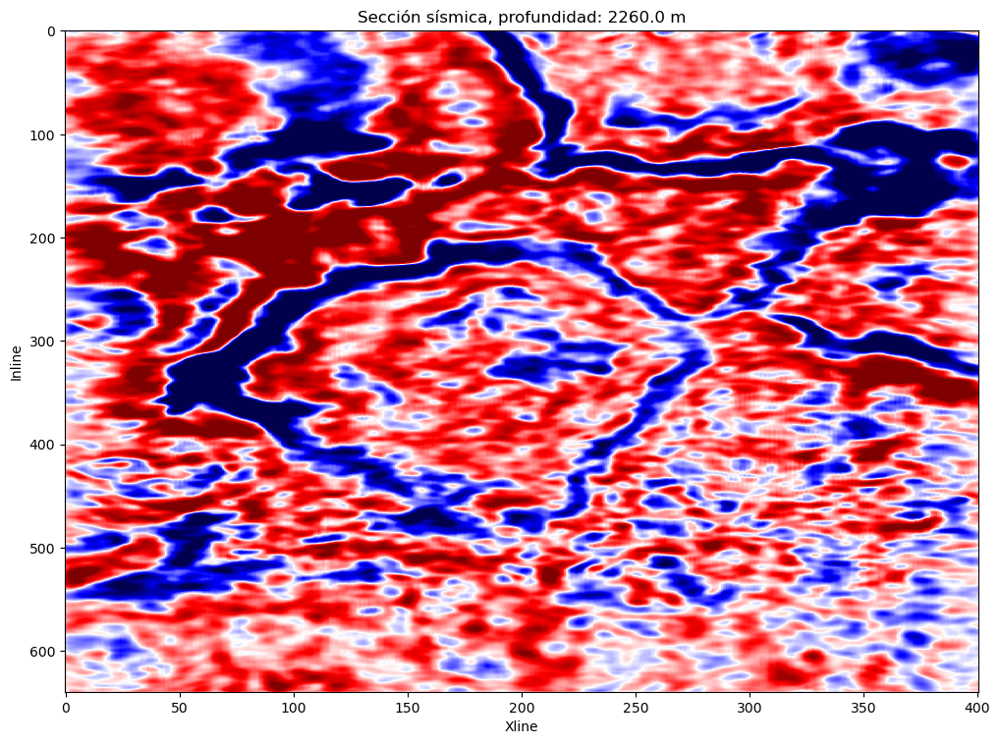

In [49]:
plt.imshow(d[:, :, depth_mid].T, cmap='seismic', vmin=-vm, vmax=vm, aspect='auto')
plt.xlabel('Xline')
plt.ylabel('Inline')
plt.title('Sección sísmica, profundidad: ' + str(t[depth_mid]) + ' m')
plt.show()

## Plotear de forma interactiva

In [50]:
import xarray as xr
import panel as pn
import hvplot.xarray
from holoviews import opts

In [51]:
opts.defaults(
    opts.Image(width=800, height=600, colorbar=True, cmap='seismic', invert_yaxis=True)
    )

In [65]:
def plot_inl(inl):
    idx = inl - ilines[0]
    da = xr.DataArray(d[idx, :, :].T)
    p = da.hvplot.image(clim=(-vm, vm), cmap='gray', flip_yaxis=True)
    return p

In [66]:
plot_inl(ilines[central_inline])

:Image   [dim_1,dim_0]   (value)

In [67]:
pn.interact(plot_inl, inl=ilines)

BokehModel(combine_events=True, render_bundle={'docs_json': {'cb61e3fc-cd94-4c64-a943-4d5e8a3dff93': {'version…

In [68]:
line_select = pn.widgets.Select(name='Inline selection', options=ilines.tolist())
pn.interact(plot_inl, inl=line_select)

BokehModel(combine_events=True, render_bundle={'docs_json': {'ba9cb679-5066-4b3a-950d-b68efe8463fc': {'version…

## Crear array de datos (Data Array)

In [69]:
da = xr.DataArray(data = d,
                  dims = ['inline', 'xline', 'depth'],
                  coords = {'inline': ilines, 'xline': xlines, 'depth': t})

In [70]:
da

<xarray.DataArray (inline: 401, xline: 640, depth: 1125)>
array([[[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-7.98719725e-07, -2.04721118e-07, -4.83611018e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-1.11241752e-06, -2.49382254e-07, -2.54932161e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-1.31961133e-06, -2.41421958e-07, -2.94026393e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
...
        [-6.65727475e-06, -1.72565888e-06, -6.84891404e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-4.04515322e-06, -1.52041321e-06, -9.47145679e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-2.39406381e-06, -1.02937065e-06, -7.00124929e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[-3.77703509e-06,  1.04544870e-06,  1.86277339e-06, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-6.81674010e-06,  1.70904150e-06,  2.94586698e-06, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-7.06574519e-06,  1.70531894e-06,  3.45246281e-06, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [-5.40037763e-06, -1.26400118e-06, -6.70061468e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-3.16261594e-06, -1.16593765e-06, -7.77351374e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-1.87396290e-06, -7.66811411e-07, -6.03390674e-07, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]])
Coordinates:
  * inline   (inline) int32 9961 9962 9963 9964 9965 ... 10358 10359 10360 10361
  * xline    (xline) int32 1961 1962 1963 1964 1965 ... 2596 2597 2598 2599 2600
  * depth    (depth) float64 12.0 16.0 20.0 24.0 ... 4.5e+03 4.504e+03 4.508e+03

In [71]:
da.sel(depth=1000)

<xarray.DataArray (inline: 401, xline: 640)>
array([[ 0.00000000e+00,  0.00000000e+00,  1.00026073e-05, ...,
         0.00000000e+00, -1.69527266e-06,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  1.30921162e-05, ...,
         0.00000000e+00, -2.48264041e-06,  0.00000000e+00],
       [ 8.08749792e-06,  1.31083443e-05,  1.65410020e-05, ...,
        -3.76792559e-06, -3.00504416e-06, -1.56740134e-06],
       ...,
       [ 0.00000000e+00,  2.83170175e-06,  1.84868532e-06, ...,
         2.30812111e-06,  2.08780693e-06,  1.42285444e-06],
       [ 0.00000000e+00,  1.09447342e-07, -4.33501611e-07, ...,
         1.67748203e-06,  1.66386599e-06,  1.10938890e-06],
       [ 1.72171622e-06,  1.55847647e-06,  4.14558826e-07, ...,
         1.34051243e-06,  1.12897214e-06,  7.35877677e-07]])
Coordinates:
  * inline   (inline) int32 9961 9962 9963 9964 9965 ... 10358 10359 10360 10361
  * xline    (xline) int32 1961 1962 1963 1964 1965 ... 2596 2597 2598 2599 2600
    depth    float64 1e+03

In [72]:
da[:, :, 1000]

<xarray.DataArray (inline: 401, xline: 640)>
array([[ 0.        ,  0.        , -0.02595623, ...,  0.        ,
        -0.1738621 ,  0.        ],
       [ 0.        ,  0.        , -0.00661602, ...,  0.        ,
        -0.22612554,  0.        ],
       [-0.06050557, -0.03318784,  0.00902984, ..., -0.30512333,
        -0.27748257, -0.19222349],
       ...,
       [ 0.        ,  0.40824038,  0.43467516, ..., -0.17440128,
        -0.11240858, -0.08395296],
       [ 0.        ,  0.37072259,  0.39831483, ..., -0.1465506 ,
        -0.09365696, -0.07172453],
       [ 0.18765134,  0.32931328,  0.37954831, ..., -0.10721093,
        -0.06409013, -0.05240742]])
Coordinates:
  * inline   (inline) int32 9961 9962 9963 9964 9965 ... 10358 10359 10360 10361
  * xline    (xline) int32 1961 1962 1963 1964 1965 ... 2596 2597 2598 2599 2600
    depth    float64 4.012e+03

In [73]:
da.sel(depth = slice(1000, 2000))

<xarray.DataArray (inline: 401, xline: 640, depth: 251)>
array([[[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.00026073e-05,  5.36379866e-06, -2.67361884e-06, ...,
         -5.07658115e-04, -6.65844418e-04, -7.05512473e-04],
        ...,
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-1.69527266e-06,  2.15490957e-07,  1.90580886e-06, ...,
          8.10946949e-05,  2.18423069e-04,  1.77743728e-04],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.30921162e-05,  6.57670535e-06, -3.45936405e-06, ...,
         -1.82117714e-04, -3.76361422e-04, -6.05229754e-04],
...
        [ 1.67748203e-06, -4.22391258e-06, -3.66588938e-06, ...,
         -2.61672074e-04, -8.62462679e-04, -1.14594400e-03],
        [ 1.66386599e-06, -3.74905449e-06, -3.21309381e-06, ...,
         -3.99293785e-05, -1.59942894e-04, -1.76577771e-04],
        [ 1.10938890e-06, -2.33506671e-06, -2.06782170e-06, ...,
          4.50309744e-05,  3.43878637e-05,  6.33728632e-05]],

       [[ 1.72171622e-06, -8.85719714e-07, -4.64704226e-06, ...,
         -3.27029848e-05, -2.68627173e-06, -1.48066720e-05],
        [ 1.55847647e-06, -8.09117751e-07, -5.85882026e-06, ...,
          1.08178152e-04,  2.40569861e-04,  2.71376222e-04],
        [ 4.14558826e-07, -6.09122822e-07, -4.45567821e-06, ...,
          6.17497601e-04,  1.07520702e-03,  1.38089014e-03],
        ...,
        [ 1.34051243e-06, -4.38141433e-06, -3.16011301e-06, ...,
         -3.35315242e-04, -8.17422988e-04, -1.10227033e-03],
        [ 1.12897214e-06, -3.94967446e-06, -2.81056236e-06, ...,
         -5.26914519e-05, -1.21088349e-04, -1.58685376e-04],
        [ 7.35877677e-07, -2.54538190e-06, -1.81575069e-06, ...,
          2.09311111e-05,  3.34914803e-05,  3.49023176e-05]]])
Coordinates:
  * inline   (inline) int32 9961 9962 9963 9964 9965 ... 10358 10359 10360 10361
  * xline    (xline) int32 1961 1962 1963 1964 1965 ... 2596 2597 2598 2599 2600
  * depth    (depth) float64 1e+03 1.004e+03 1.008e+03 ... 1.996e+03 2e+03

In [74]:
da.attrs['Year'] = '2002'
da.attrs['Type'] = 'PSDM depth converted 3D seismic data'

In [75]:
volve_ds = da.to_dataset(name = 'base')
volve_ds.attrs['Contributor'] = 'Equinor'
volve_ds.attrs['Field'] = 'Volve'
volve_ds.attrs['Location'] = 'North Sea'
volve_ds.attrs['Country'] = 'Norway'

In [76]:
volve_ds

<xarray.Dataset>
Dimensions:  (inline: 401, xline: 640, depth: 1125)
Coordinates:
  * inline   (inline) int32 9961 9962 9963 9964 9965 ... 10358 10359 10360 10361
  * xline    (xline) int32 1961 1962 1963 1964 1965 ... 2596 2597 2598 2599 2600
  * depth    (depth) float64 12.0 16.0 20.0 24.0 ... 4.5e+03 4.504e+03 4.508e+03
Data variables:
    base     (inline, xline, depth) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes:
    Contributor:  Equinor
    Field:        Volve
    Location:     North Sea
    Country:      Norway

In [79]:
volve_ds['base'].sel(inline=9980)

<xarray.DataArray 'base' (xline: 640, depth: 1125)>
array([[-2.83260761e-06,  2.33981041e-07,  5.46956130e-07, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-3.48828235e-06,  5.45104456e-07,  9.84306098e-07, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-3.28533770e-06,  7.67757967e-07,  1.17708896e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 1.57931140e-07,  1.32176046e-06,  1.39291478e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 7.41113638e-07,  1.56205351e-06,  1.56488386e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 9.22895595e-07,  1.27257226e-06,  1.33618687e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])
Coordinates:
    inline   int32 9980
  * xline    (xline) int32 1961 1962 1963 1964 1965 ... 2596 2597 2598 2599 2600
  * depth    (depth) float64 12.0 16.0 20.0 24.0 ... 4.5e+03 4.504e+03 4.508e+03
Attributes:
    Year:     2002
    Type:     PSDM depth converted 3D seismic data

In [81]:
volve_ds.save('volve_seismic.nc')

AttributeError: 'Dataset' object has no attribute 'save'